# Annotation of functional phenotype result

## Regulatory element annotation

### Create balance set of SNP
Based on fabiha's code

In [1]:
#### Read CS SNP


In [3]:
import pandas as pd
import numpy as np

In [8]:
meQTL_pure_completed_unlimted = pd.read_csv("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/mQTL_pure_completed_unlimited_16_99pCS.tsv",sep = "\t")
haQTL_pure_completed_unlimted = pd.read_csv("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/haQTL_pure_completed_unlimited_16_99pCS.tsv",sep = "\t")

In [9]:
CS_snp = pd.concat([haQTL_pure_completed_unlimted.variants ,meQTL_pure_completed_unlimted.variants] )

In [10]:

CS_snp = CS_snp.drop_duplicates()

In [11]:
CS_snp

0             chr1:19383508_G_T
1             chr1:19384300_G_A
2             chr1:19385255_G_A
3             chr1:19385445_T_C
4             chr1:19390307_C_T
                  ...          
53855       chr11:134950529_C_G
53856    chr11:134952168_GTTT_G
53857       chr11:134952198_A_G
53858       chr11:134956964_C_T
53859       chr11:134964618_T_C
Name: variants, Length: 74065, dtype: object

In [12]:
CS_snp

0             chr1:19383508_G_T
1             chr1:19384300_G_A
2             chr1:19385255_G_A
3             chr1:19385445_T_C
4             chr1:19390307_C_T
                  ...          
53855       chr11:134950529_C_G
53856    chr11:134952168_GTTT_G
53857       chr11:134952198_A_G
53858       chr11:134956964_C_T
53859       chr11:134964618_T_C
Name: variants, Length: 74065, dtype: object

### Annotate maf with LD block information
Following code merge the maf table with the LD block, only run once due to mem consumption
```
LD_block = pd.read_csv("/mnt/vast/hpc/csg/molecular_phenotype_calling/LD/1300_hg38_EUR_LD_blocks.tsv","\t")
maf = pd.read_csv("/mnt/vast/hpc/csg/molecular_phenotype_calling/genotype/ROSMAP_NIA_WGS.leftnorm.filtered.filtered.afreq","\t")
maf["POS"] = [ int(x.split(":")[1].split("_")[0]) for x in maf.ID]
temp = []
LD_block["CHROM"] = [int(x.strip("chr") ) for x in LD_block["#chr"] ]
maf = maf.rename({"#CHROM": "CHROM"},axis= 1)
for i in range(1,23,1) :
    maf_tmp = maf.query("CHROM == @i")
    maf_tmp = maf_tmp.merge(LD_block, on = "CHROM").query("POS < stop &  POS > start ")
    temp.append(maf_tmp)
maf_block = pd.concat(temp)
maf_block.to_csv("/mnt/vast/hpc/csg/molecular_phenotype_calling/genotype/ROSMAP_NIA_WGS.leftnorm.filtered.filtered.1300LDBlock_afreq.tsv","\t")
```

In [13]:
maf_block = pd.read_csv("/mnt/vast/hpc/csg/molecular_phenotype_calling/genotype/ROSMAP_NIA_WGS.leftnorm.filtered.filtered.1300LDBlock_afreq.tsv","\t")

/home/hs3163/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3441: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [14]:
cs_snp = maf_block.query("ID_x in @CS_snp")

In [15]:
cs_snp

,Unnamed: 0,CHROM,ID_x,REF,ALT,ALT_FREQS,OBS_CT,POS,#chr,start,stop,ID_y,#CHROM
3051,323925,1,chr1:1094425_A_G,A,G,0.168103,2320,1094425,chr1,16103,2888443,LDBlock1,1
3058,324660,1,chr1:1096593_C_T,C,T,0.168103,2320,1096593,chr1,16103,2888443,LDBlock1,1
3064,325290,1,chr1:1098216_T_C,T,C,0.168103,2320,1098216,chr1,16103,2888443,LDBlock1,1
3065,325395,1,chr1:1098246_C_G,C,G,0.168103,2320,1098246,chr1,16103,2888443,LDBlock1,1
3067,325605,1,chr1:1098300_T_A,T,A,0.168103,2320,1098300,chr1,16103,2888443,LDBlock1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15525807,4679959,22,chr22:50435128_A_G,A,G,0.243534,2320,50435128,chr22,49355984,50799822,LDBlock1361,22
15525808,4679979,22,chr22:50435132_C_T,C,T,0.243534,2320,50435132,chr22,49355984,50799822,LDBlock1361,22
15526357,4690959,22,chr22:50500875_G_C,G,C,0.718966,2320,50500875,chr22,49355984,50799822,LDBlock1361,22
15526360,4691019,22,chr22:50501157_G_C,G,C,0.717672,2320,50501157,chr22,49355984,50799822,LDBlock1361,22


In [16]:
control_snp  = maf_block.query("ID_x not in @CS_snp")

In [17]:
control_snp 

,Unnamed: 0,CHROM,ID_x,REF,ALT,ALT_FREQS,OBS_CT,POS,#chr,start,stop,ID_y,#CHROM
0,3570,1,chr1:16206_T_A,T,A,0.002155,2320,16206,chr1,16103,2888443,LDBlock1,1
1,3675,1,chr1:16433_C_G,C,G,0.002155,2320,16433,chr1,16103,2888443,LDBlock1,1
2,3780,1,chr1:16619_C_T,C,T,0.002595,2312,16619,chr1,16103,2888443,LDBlock1,1
3,3885,1,chr1:16646_C_T,C,T,0.005652,2300,16646,chr1,16103,2888443,LDBlock1,1
4,3990,1,chr1:16666_G_A,G,A,0.002165,2310,16666,chr1,16103,2888443,LDBlock1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15528432,4732459,22,chr22:50798936_A_G,A,G,0.003025,2314,50798936,chr22,49355984,50799822,LDBlock1361,22
15528433,4732479,22,chr22:50798948_A_C,A,C,0.003893,2312,50798948,chr22,49355984,50799822,LDBlock1361,22
15528434,4732499,22,chr22:50799179_T_C,T,C,0.002170,2304,50799179,chr22,49355984,50799822,LDBlock1361,22
15528435,4732519,22,chr22:50799183_G_A,G,A,0.002166,2308,50799183,chr22,49355984,50799822,LDBlock1361,22


In [18]:
control_snp_select = []
control_snp_select_replace = []

In [19]:
df = control_snp.query("ID_y == 'LDBlock1'").query('ID_x not in @control_snp_select ')
df = df.assign(AF_diff = abs(df.ALT_FREQS - 0.168103) ).sort_values("AF_diff").head(5)

In [ ]:
control_snp.query("ID_y == 'LDBlock1'").query('ID_x not in @control_snp_select ')

In [22]:
control_snp

,Unnamed: 0,CHROM,ID_x,REF,ALT,ALT_FREQS,OBS_CT,POS,#chr,start,stop,ID_y,#CHROM
0,3570,1,chr1:16206_T_A,T,A,0.002155,2320,16206,chr1,16103,2888443,LDBlock1,1
1,3675,1,chr1:16433_C_G,C,G,0.002155,2320,16433,chr1,16103,2888443,LDBlock1,1
2,3780,1,chr1:16619_C_T,C,T,0.002595,2312,16619,chr1,16103,2888443,LDBlock1,1
3,3885,1,chr1:16646_C_T,C,T,0.005652,2300,16646,chr1,16103,2888443,LDBlock1,1
4,3990,1,chr1:16666_G_A,G,A,0.002165,2310,16666,chr1,16103,2888443,LDBlock1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15528432,4732459,22,chr22:50798936_A_G,A,G,0.003025,2314,50798936,chr22,49355984,50799822,LDBlock1361,22
15528433,4732479,22,chr22:50798948_A_C,A,C,0.003893,2312,50798948,chr22,49355984,50799822,LDBlock1361,22
15528434,4732499,22,chr22:50799179_T_C,T,C,0.002170,2304,50799179,chr22,49355984,50799822,LDBlock1361,22
15528435,4732519,22,chr22:50799183_G_A,G,A,0.002166,2308,50799183,chr22,49355984,50799822,LDBlock1361,22


In [24]:
cs_snp

,Unnamed: 0,CHROM,ID_x,REF,ALT,ALT_FREQS,OBS_CT,POS,#chr,start,stop,ID_y,#CHROM
3051,323925,1,chr1:1094425_A_G,A,G,0.168103,2320,1094425,chr1,16103,2888443,LDBlock1,1
3058,324660,1,chr1:1096593_C_T,C,T,0.168103,2320,1096593,chr1,16103,2888443,LDBlock1,1
3064,325290,1,chr1:1098216_T_C,T,C,0.168103,2320,1098216,chr1,16103,2888443,LDBlock1,1
3065,325395,1,chr1:1098246_C_G,C,G,0.168103,2320,1098246,chr1,16103,2888443,LDBlock1,1
3067,325605,1,chr1:1098300_T_A,T,A,0.168103,2320,1098300,chr1,16103,2888443,LDBlock1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15525807,4679959,22,chr22:50435128_A_G,A,G,0.243534,2320,50435128,chr22,49355984,50799822,LDBlock1361,22
15525808,4679979,22,chr22:50435132_C_T,C,T,0.243534,2320,50435132,chr22,49355984,50799822,LDBlock1361,22
15526357,4690959,22,chr22:50500875_G_C,G,C,0.718966,2320,50500875,chr22,49355984,50799822,LDBlock1361,22
15526360,4691019,22,chr22:50501157_G_C,G,C,0.717672,2320,50501157,chr22,49355984,50799822,LDBlock1361,22


In [ ]:
for i,j in zip(cs_snp.ALT_FREQS,cs_snp.ID_y):
        df = control_snp.query("ID_y == @j")
        snp_selected = df.assign(AF_diff = abs(df.ALT_FREQS - i) ).sort_values("AF_diff").head(10).ID_x 
        control_snp_select_replace.append(snp_selected)


In [46]:
j

'LDBlock1361'

In [ ]:
control_snp_select_replace_pd = pd.concat(control_snp_select_replace)

In [ ]:
control_snp_select_replace_pd.to_csv("~/Negative_snp_set.tsv",sep = "\t", index = 0)

In [ ]:
cs_snp

In [ ]:
control_snp_select_replace_pd = pd.DataFrame({"ID" : control_snp_select_replace_pd})

In [ ]:
control_snp_select_replace_pd = control_snp_select_replace_pd.assign(signal = "Control",  CHROM = lambda x: [int(i.split(":")[0].strip("chr")) for i in  x.ID  ] , POS = lambda x:  [int(i.split(":")[1].split("_")[0]) for i in  x.ID  ]  )

In [ ]:
enrichment_snp = pd.concat([control_snp_select_replace_pd.drop_duplicates(), cs_snp.rename(columns  = {"ID_x" : "ID" })[["ID", "CHROM", "POS" ] ].assign(signal = "Case") ])

In [ ]:
enrichment_snp.to_csv("~/Enrichment_snp_set.tsv",sep = "\t", index = 0)

In [47]:
enrichment_snp

,ID,signal,CHROM,POS
0,chr1:2230051_C_T,Control,1,2230051
1,chr1:1001870_C_G,Control,1,1001870
2,chr1:1042813_G_A,Control,1,1042813
3,chr1:2222258_T_C,Control,1,2222258
4,chr1:2809387_C_T,Control,1,2809387
...,...,...,...,...
346656,chr22:50435128_A_G,Case,22,50435128
346657,chr22:50435132_C_T,Case,22,50435132
346658,chr22:50500875_G_C,Case,22,50500875
346659,chr22:50501157_G_C,Case,22,50501157


In [ ]:
cs_snp.rename(columns  = {"ID_x" : "ID" })

## Get the features:

In [42]:
options(repr.plot.width =30, repr.plot.height = 20)

In [48]:
features = pd.read_csv("/mnt/vast/hpc/csg/molecular_phenotype_calling/reference_data/20221207_ddsvbasenji_data_files.feature_table.wg.txt","\t")

/home/hs3163/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3441: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [49]:
enrichment_snp = pd.read_csv("~/Enrichment_snp_set.tsv","\t")

/home/hs3163/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3441: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [50]:
features

,CHR,BP,SNP,CM,base,Coding_UCSC,Coding_UCSC.flanking.500,Conserved_LindbladToh,Conserved_LindbladToh.flanking.500,CTCF_Hoffman,...,Human_Promoter_Villar.flanking.500,Human_Enhancer_Villar,Human_Enhancer_Villar.flanking.500,Ancient_Sequence_Age_Human_Promoter,Ancient_Sequence_Age_Human_Promoter.flanking.500,Ancient_Sequence_Age_Human_Enhancer,Ancient_Sequence_Age_Human_Enhancer.flanking.500,Human_Enhancer_Villar_Species_Enhancer_Count,Human_Promoter_Villar_ExAC,Human_Promoter_Villar_ExAC.flanking.500
0,1,11008,rs575272151,0.00000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,11012,rs544419019,0.00000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,13110,rs540538026,0.00000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,13116,rs62635286,0.00000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,13118,rs200579949,0.00000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991224,9,138219722,rs199874188,180.47343,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9991225,9,138220664,rs189465129,180.47343,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9991226,9,138232056,rs536233379,180.47343,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9991227,9,138233797,rs543632557,180.47343,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
enrichment_feature = enrichment_snp.rename(columns = {"CHROM": "CHR", "POS":"BP"}).merge(features)

In [52]:
enrichment_feature.to_csv("~/Enrichment_annotation.tsv")

In [56]:
sum(enrichment_feature.signal == "Case")

62837

In [55]:
sum(enrichment_feature.signal == "Control")

205358

## Enrichment Analysis (In R)

In [1]:
library("dplyr")
library("purrr")
library("readr")
library("ggplot2")


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [3]:
library("logistf")

In [4]:
enrichment_feature = read_delim("~/Enrichment_annotation.tsv")

New names:
• `` -> `...1`
Rows: 268195 Columns: 91
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (3): ID, signal, SNP
dbl (88): ...1, CHR, BP, CM, base, Coding_UCSC, Coding_UCSC.flanking.500, Co...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


### Take a look at the features

In [7]:
enrichment_feature =  enrichment_feature%>%mutate(signal = signal== "Case" ) 

In [9]:
enrichment_feature%>%filter(!signal)

...1,ID,signal,CHR,BP,SNP,CM,base,Coding_UCSC,Coding_UCSC.flanking.500,...,Human_Promoter_Villar.flanking.500,Human_Enhancer_Villar,Human_Enhancer_Villar.flanking.500,Ancient_Sequence_Age_Human_Promoter,Ancient_Sequence_Age_Human_Promoter.flanking.500,Ancient_Sequence_Age_Human_Enhancer,Ancient_Sequence_Age_Human_Enhancer.flanking.500,Human_Enhancer_Villar_Species_Enhancer_Count,Human_Promoter_Villar_ExAC,Human_Promoter_Villar_ExAC.flanking.500
<dbl>,<chr>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,chr1:2230051_C_T,FALSE,1,2230051,rs3765930,2.3978973,1,0,1,...,0,0,0,1,0,0,0,0,1,0
1,chr1:1001870_C_G,FALSE,1,1001870,rs28615823,0.7344940,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,chr1:1042813_G_A,FALSE,1,1042813,rs2710873,0.7955923,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,chr1:2222258_T_C,FALSE,1,2222258,rs74474329,2.3960852,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,chr1:2809387_C_T,FALSE,1,2809387,rs7538063,3.5260876,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,chr1:2222256_T_C,FALSE,1,2222256,rs74813688,2.3960847,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,chr1:2222257_G_C,FALSE,1,2222257,rs77380272,2.3960850,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,chr1:1098290_T_C,FALSE,1,1098290,rs6604966,0.8743551,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,chr1:1201373_T_C,FALSE,1,1201373,rs186608774,1.1465978,1,0,0,...,0,1,0,0,0,0,1,2,0,0


### For each features, do linear regression, logisitic regression, and chisq.test

In [ ]:
result_list_log = map(colnames(enrichment_feature)[9:ncol(enrichment_feature)],~(glm( signal ~ enrichment_feature%>%pull(.x) ,enrichment_feature, family = "binomial"  )%>%summary)$coefficients  )

In [ ]:
result_list = map(colnames(enrichment_feature)[9:ncol(enrichment_feature)],~(lm( signal ~ enrichment_feature%>%pull(.x) ,enrichment_feature )%>%summary)  )

In [ ]:
result_list[[1]]$coefficients

In [ ]:
plot_df = tibble(feature =  colnames(enrichment_feature)[9:ncol(enrichment_feature)] , result = result_list )%>%mutate(mean = map_dbl(result, ~.x$coefficients[[2,1]]) , sd =  map_dbl(result, ~.x$coefficients[[2,2]]) )

In [ ]:
plot_df = plot_df%>%select(-result)%>%mutate(low = mean - sd, high = mean+sd)

## For redo log regression using firth log via logistf package to reduce bias

In [20]:
result_list_flog = map(colnames(enrichment_feature)[9:ncol(enrichment_feature)],~(logistf( signal ~ enrichment_feature%>%pull(.x) ,data = enrichment_feature))  )

In [26]:
test = (result_list_flog[[1]]%>%summary)

logistf(formula = signal ~ enrichment_feature %>% pull(.x), data = enrichment_feature)

Model fitted by Penalized ML
Coefficients:
                                      coef    se(coef) lower 0.95 upper 0.95
(Intercept)                     -1.1961832 0.004623879 -1.2052532  -1.187128
enrichment_feature %>% pull(.x)  0.4925688 0.028250620  0.4370317   0.547779
                                Chisq p method
(Intercept)                       Inf 0      2
enrichment_feature %>% pull(.x)   Inf 0      2

Method: 1-Wald, 2-Profile penalized log-likelihood, 3-None

Likelihood ratio test=286.4206 on 1 df, p=0, n=268195
Wald test = 67561.49 on 1 df, p = 0

In [31]:
result_list_flog[[1]]$ci.lower

(Intercept) enrichment_feature %>% pull(.x) 
                     -1.2052532                       0.4370317

In [32]:
plot_df_flog  = tibble(feature =  colnames(enrichment_feature)[9:ncol(enrichment_feature)] , result = result_list_flog )%>%mutate(mean = map_dbl(result, ~.x$coefficients[2]) , upper =  map_dbl(result, ~.x$ci.upper[[2]]), lower =  map_dbl(result, ~.x$ci.lower[[2]])  )

plot_df_flog = plot_df_flog%>%select(-result)

In [39]:
plot_df_flog

feature,mean,upper,lower
<chr>,<dbl>,<dbl>,<dbl>
Coding_UCSC,0.49256876,0.54777901,0.437031736
Coding_UCSC.flanking.500,0.32835893,0.36125878,0.295333489
Conserved_LindbladToh,0.27196596,0.32062827,0.222985448
Conserved_LindbladToh.flanking.500,0.20441502,0.22284655,0.185971396
CTCF_Hoffman,0.26515284,0.31366034,0.216327318
CTCF_Hoffman.flanking.500,0.18522826,0.22195397,0.148318555
DGF_ENCODE,0.38077940,0.40288971,0.358630576
DGF_ENCODE.flanking.500,0.07358653,0.09151175,0.055657612
DHS_peaks_Trynka,0.43701415,0.46071080,0.413270862


### Forrest plot
For combined enrichment, the `CpG_Content_50kb` stands out

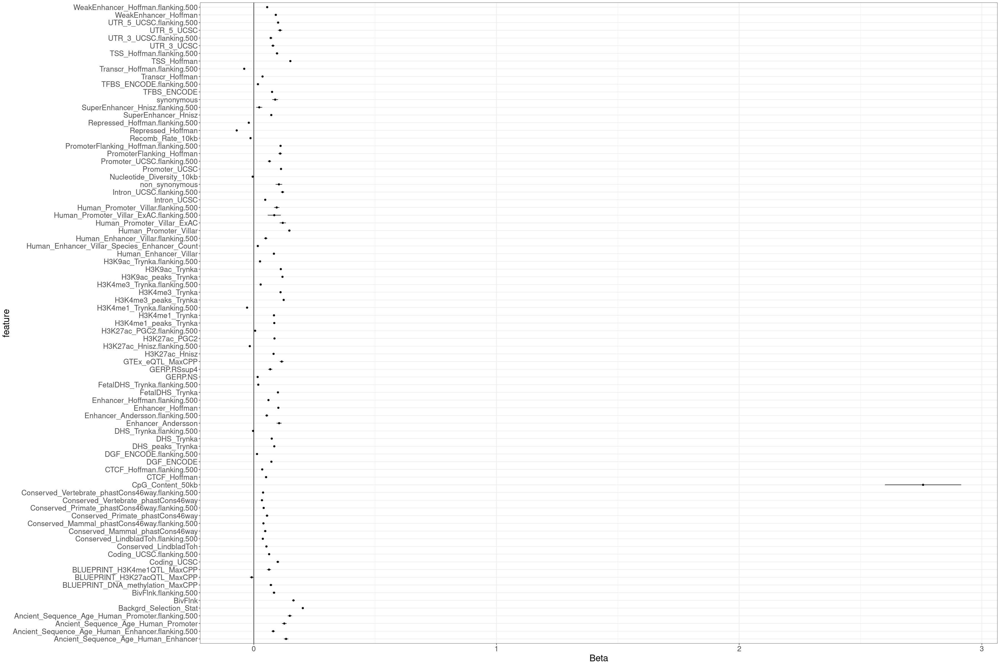

In [88]:
plot_df%>%ggplot()+geom_point(aes(x = mean, y = feature))+geom_linerange(aes(xmin = low, xmax= high , y = feature ))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Beta")

In [31]:

plot_df%>%count(feature)%>%filter(stringr::str_detect(feature,"CpG"))

feature,n
<chr>,<int>
CpG_Content_50kb,1


In [60]:
which(plot_df$feature == "CpG_Content_50kb")

[1] 58

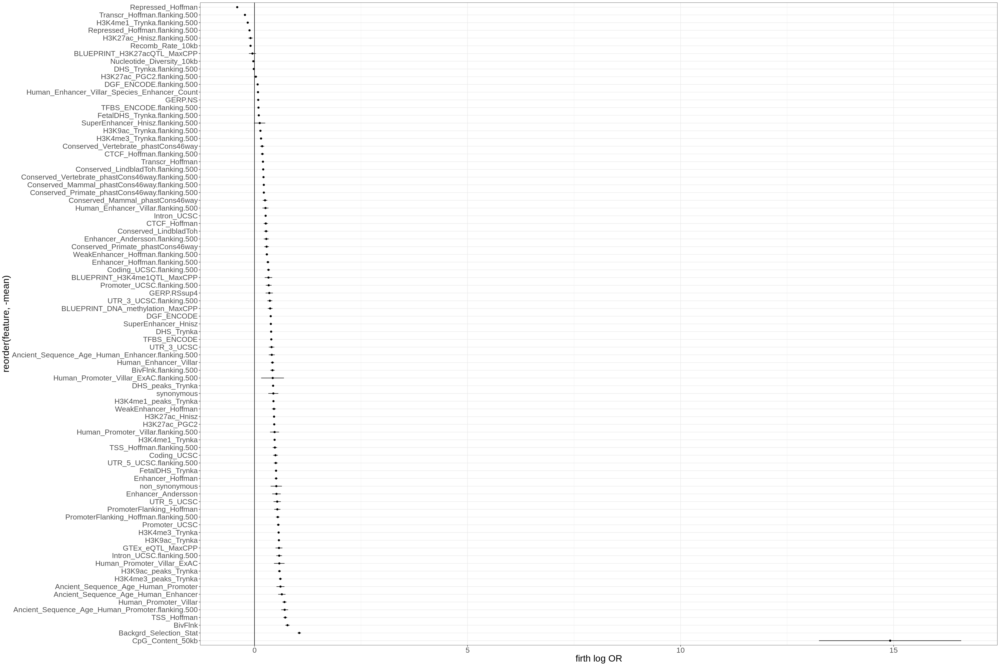

In [67]:
plot_df_flog%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = reorder(feature,-mean)))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("firth log OR")

### Analysing ha and me seperately

In [44]:
h16 =  read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/haQTL_pure_completed_unlimited_16_99pCS.tsv","\t")
m16 =  read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/mQTL_pure_completed_unlimited_16_99pCS.tsv","\t")

Rows: 21527 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (11): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 53860 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (11): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [113]:
plot_df

feature,mean,sd,low,high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Coding_UCSC,0.098828399,0.005613346,0.093215053,0.104441745
Coding_UCSC.flanking.500,0.063165484,0.003221275,0.059944209,0.066386760
Conserved_LindbladToh,0.051997055,0.004750121,0.047246934,0.056747176
Conserved_LindbladToh.flanking.500,0.037197074,0.001708865,0.035488209,0.038905938
CTCF_Hoffman,0.050615400,0.004728439,0.045886961,0.055343839
CTCF_Hoffman.flanking.500,0.034638326,0.003509262,0.031129064,0.038147589
DGF_ENCODE,0.072455602,0.002135614,0.070319988,0.074591215
DGF_ENCODE.flanking.500,0.013223655,0.001643337,0.011580319,0.014866992
DHS_peaks_Trynka,0.084408861,0.002319154,0.082089707,0.086728014


In [45]:
ha_enrichment_feature = enrichment_feature%>%filter(! (signal & ! ID %in% h16$variants)  )

In [46]:
m_enrichment_feature = enrichment_feature%>%filter(! (signal & ! ID %in% m16$variants)  )

In [47]:
length(intersect(m16$variants , m_enrichment_feature$ID))

[1] 45801

In [48]:
length(m16$variants)

[1] 53860

In [49]:
length(intersect(h16$variants , m_enrichment_feature$ID))

[1] 1170

In [53]:
length(intersect(h16$variants , ha_enrichment_feature%>%filter(signal)%>%pull(ID)))
length(h16$variants)
length(intersect(m16$variants , ha_enrichment_feature$ID))

[1] 18206

[1] 21527

[1] 1170

### Log regression

In [58]:
result_list_log_m = map(colnames(m_enrichment_feature)[9:ncol(m_enrichment_feature)],~(glm( signal ~ m_enrichment_feature%>%pull(.x) ,m_enrichment_feature, family = "binomial"  )%>%summary)$coefficients  )

In [59]:
result_list_log_ha = map(colnames(ha_enrichment_feature)[9:ncol(ha_enrichment_feature)],~(glm( signal ~ ha_enrichment_feature%>%pull(.x) ,ha_enrichment_feature, family = "binomial"  )%>%summary)$coefficients  )

In [60]:
plot_df_log_m = tibble(feature =  colnames(enrichment_feature)[9:ncol(enrichment_feature)] , result = result_list_log_m )%>%mutate(mean = map_dbl(result, ~.x[[2,1]]) , sd =  map_dbl(result, ~.x[[2,2]]) , low = mean - 1.96*sd, high = mean + 1.96*sd )%>%select(-result)

In [61]:
plot_df_log_ha = tibble(feature =  colnames(enrichment_feature)[9:ncol(enrichment_feature)] , result = result_list_log_ha )%>%mutate(mean = map_dbl(result, ~.x[[2,1]]) , sd =  map_dbl(result, ~.x[[2,2]]) , low = mean - 1.96*sd, high = mean + 1.96*sd )%>%select(-result)

In [62]:
plot_df_log_m_ha = rbind(plot_df_log_m%>%mutate(type = "mQTL CS"),plot_df_log_ha%>%mutate(type = "haQTL CS"))

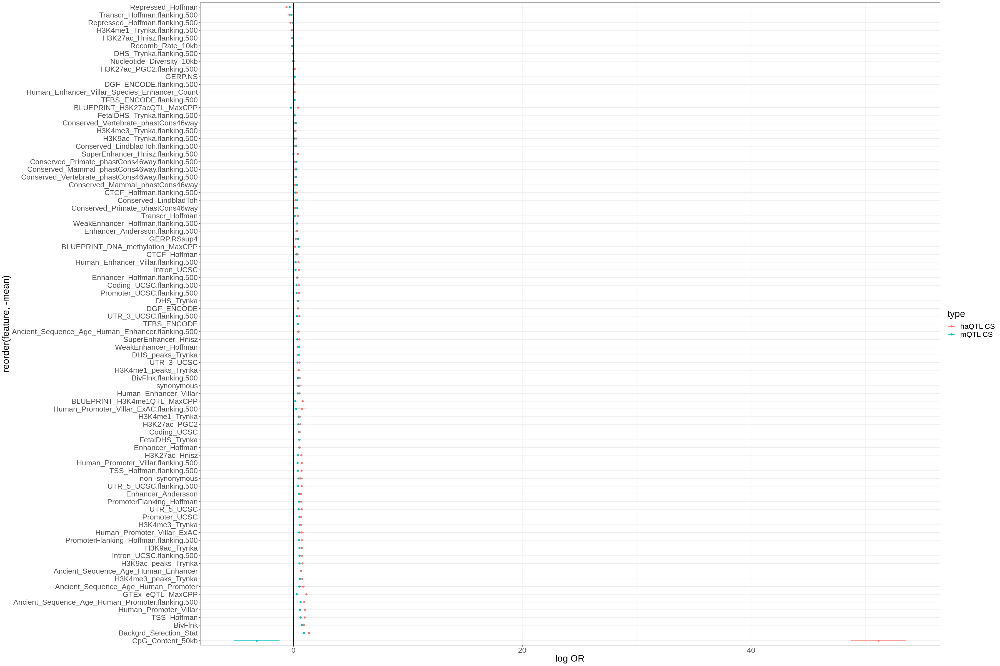

In [63]:
plot_df_log_m_ha%>%filter()%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = reorder(feature,-mean), color = type))+geom_linerange(aes(xmin = low, xmax= high , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("log OR")

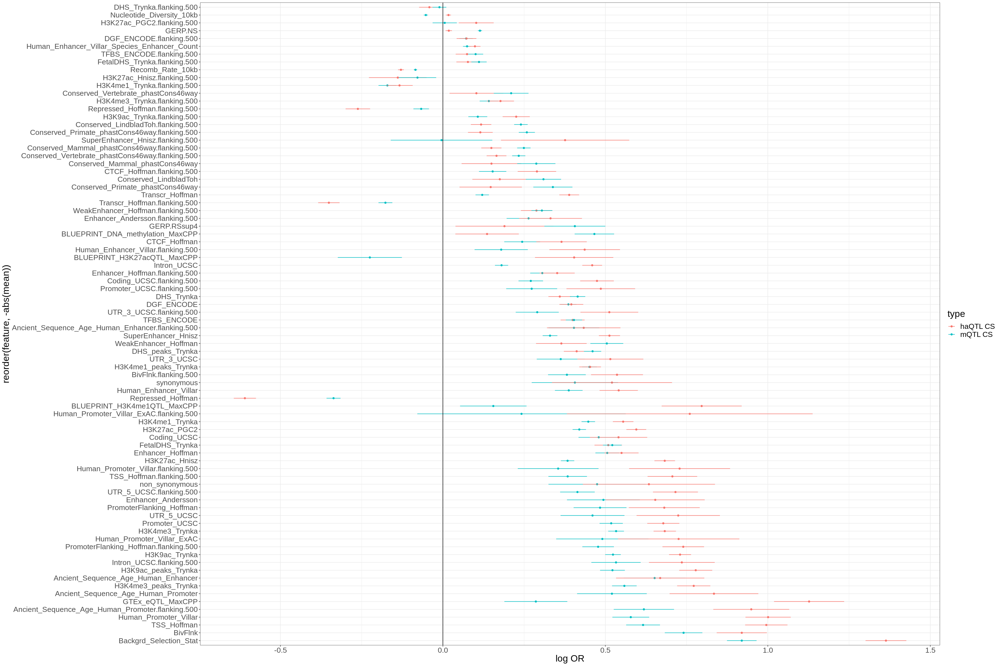

In [270]:
plot_df_log_m_ha%>%filter(feature!= "CpG_Content_50kb")%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = reorder(feature,-abs(mean)), color = type))+geom_linerange(aes(xmin = low, xmax= high , y = reorder(feature,-mean) ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("log OR")

### Firth Log regression

In [68]:
result_list_flog_m = map(colnames(enrichment_feature)[9:ncol(enrichment_feature)],~(logistf( signal ~ m_enrichment_feature%>%pull(.x) ,data = m_enrichment_feature))  )

In [69]:
result_list_flog_ha = map(colnames(enrichment_feature)[9:ncol(enrichment_feature)],~(logistf( signal ~ ha_enrichment_feature%>%pull(.x) ,data = ha_enrichment_feature))  )

In [284]:
plot_df_flog_m  = tibble(feature =  colnames(enrichment_feature)[9:ncol(enrichment_feature)] , result = result_list_flog_m )%>%mutate(mean = map_dbl(result, ~.x$coefficients[2]) , upper =  map_dbl(result, ~.x$ci.upper[[2]]), lower =  map_dbl(result, ~.x$ci.lower[[2]]),pvalue = map_dbl(result, ~.x$prob[[2]])  )%>%select(-result)
plot_df_flog_ha  = tibble(feature =  colnames(enrichment_feature)[9:ncol(enrichment_feature)] , result = result_list_flog_ha )%>%mutate(mean = map_dbl(result, ~.x$coefficients[2]) , upper =  map_dbl(result, ~.x$ci.upper[[2]]), lower =  map_dbl(result, ~.x$ci.lower[[2]]),pvalue = map_dbl(result, ~.x$prob[[2]])  )%>%select(-result)


In [286]:
plot_df_flog_m_ha = rbind(plot_df_flog_m%>%mutate(type = "mQTL CS"),plot_df_flog_ha%>%mutate(type = "haQTL CS"))

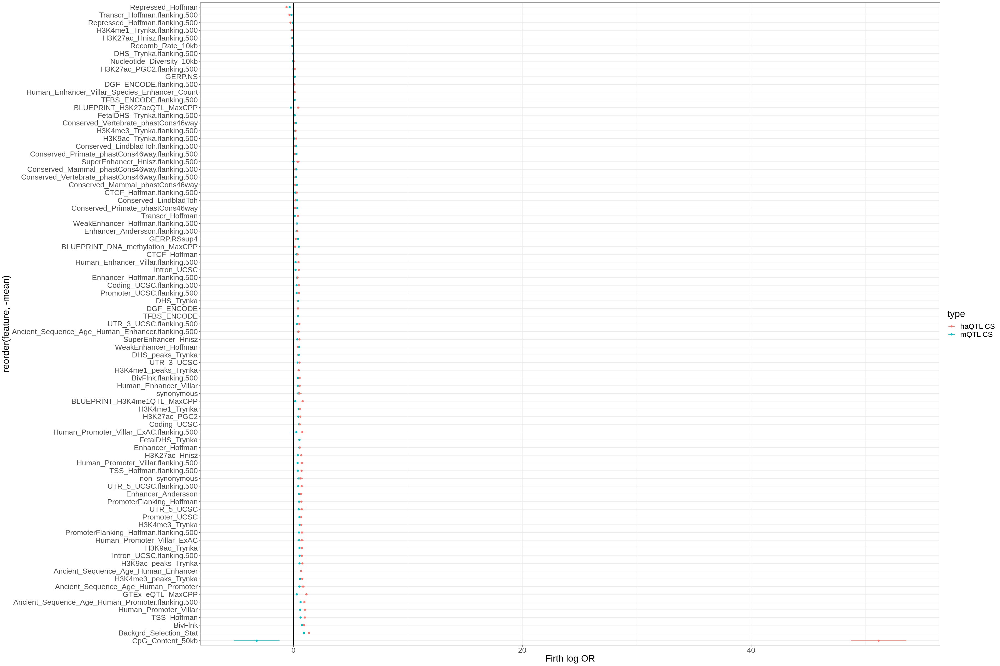

In [287]:
plot_df_flog_m_ha%>%filter()%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = reorder(feature,-mean), color = type))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Firth log OR")

In [288]:
result_list_flog_m[[1]]$prob

(Intercept) m_enrichment_feature %>% pull(.x) 
                                0                                 0

In [289]:
enrichment_feature$CpG_Content_50kb

[1] 0.035180000 0.045830000 0.046550000 0.035930000 0.023394240 0.035930000
    [7] 0.035930000 0.040680000 0.041820000 0.035920000 0.034200000 0.034980000
   [13] 0.034020000 0.034790000 0.036240000 0.036170000 0.032380000 0.036170000
   [19] 0.034090000 0.034430000 0.027880000 0.024500000 0.024590000 0.024590000
   [25] 0.024400000 0.014630000 0.025140000 0.023870000 0.023790000 0.030620000
   [31] 0.030460000 0.024250000 0.026170000 0.027760000 0.023710000 0.030580000
   [37] 0.024280000 0.023940000 0.022830000 0.030510000 0.030470000 0.030690000
   [43] 0.022740000 0.022820000 0.016480000 0.016640000 0.029210000 0.024820000
   [49] 0.016410000 0.024040000 0.031900000 0.014830000 0.026770000 0.016460000
   [55] 0.026520000 0.024460000 0.024390000 0.024410000 0.016610000 0.032200000
   [61] 0.024090000 0.023870000 0.022180000 0.023470000 0.024240000 0.024300000
   [67] 0.024150000 0.024140000 0.023510000 0.023470000 0.024020000 0.026990000
   [73] 0.030280000 0.023030000 0.023120000 0.023460000 0.023160000 0.016280000
   [79] 0.016290000 0.017430000 0.028800000 0.017730000 0.017670000 0.026680000
   [85] 0.017760000 0.018300000 0.018260000 0.023610000 0.017630000 0.026720000
   [91] 0.022010000 0.017470000 0.013430000 0.019920000 0.022690000 0.021530000
   [97] 0.018230000 0.024270000 0.026820000 0.017410000 0.022530000 0.026060000
  [103] 0.022080000 0.029200000 0.027040000 0.026090000 0.026240000 0.027380000
  [109] 0.021140000 0.021860000 0.023000000 0.024320000 0.022770000 0.023050000
  [115] 0.024470000 0.010940000 0.024470000 0.023050000 0.023480000 0.021380000
  [121] 0.023060000 0.017530000 0.023790000 0.022850000 0.018720000 0.015360000
  [127] 0.018970000 0.022080000 0.022290000 0.022070000 0.025130000 0.025130000
  [133] 0.015430000 0.017580000 0.024650000 0.024760000 0.024830000 0.023120000
  [139] 0.017430000 0.023400000 0.018230000 0.017410000 0.023350000 0.023110000
  [145] 0.022990000 0.017500000 0.025280000 0.023420000 0.018760000 0.016720000
  [151] 0.028990000 0.030340000 0.025090000 0.017780000 0.016090000 0.030100000
  [157] 0.011660000 0.016510000 0.016190000 0.016690000 0.016910000 0.017560000
  [163] 0.016690000 0.016820000 0.018430000 0.018650000 0.017440000 0.022410000
  [169] 0.023040000 0.022950000 0.023590000 0.022560000 0.022540000 0.022020000
  [175] 0.022530000 0.022270000 0.022190000 0.022790000 0.015160000 0.022010000
  [181] 0.015860000 0.017350000 0.013480000 0.022800000 0.021900000 0.027160000
  [187] 0.022690000 0.028940000 0.010560000 0.010410000 0.011700000 0.010290000
  [193] 0.030810000 0.030280000 0.030490000 0.031800000 0.030480000 0.031730000
  [199] 0.031250000 0.031800000 0.030270000 0.016220000 0.023490000 0.017500000
  [205] 0.018120000 0.018260000 0.015570000 0.018240000 0.020230000 0.020260000
  [211] 0.018360000 0.019790000 0.018400000 0.030910000 0.017540000 0.017530000
  [217] 0.017560000 0.017580000 0.019090000 0.029290000 0.024320000 0.015610000
  [223] 0.025750000 0.024490000 0.015630000 0.015370000 0.023720000 0.025780000
  [229] 0.025780000 0.027880000 0.024140000 0.024010000 0.024010000 0.023710000
  [235] 0.030110000 0.024630000 0.022550000 0.025040000 0.012830000 0.024620000
  [241] 0.012240000 0.011910000 0.012760000 0.012700000 0.015210000 0.022550000
  [247] 0.024620000 0.016260000 0.016180000 0.022790000 0.031530000 0.015760000
  [253] 0.018740000 0.018630000 0.020040000 0.020070000 0.023420000 0.014510000
  [259] 0.015790000 0.029000000 0.018690000 0.024120000 0.018680000 0.020340000
  [265] 0.017330000 0.020050000 0.020220000 0.015600000 0.022940000 0.016510000
  [271] 0.016420000 0.016480000 0.022500000 0.017330000 0.015960000 0.021100000
  [277] 0.025560000 0.016500000 0.010670000 0.025560000 0.025570000 0.017570000
  [283] 0.017340000 0.017530000 0.018160000 0.017510000 0.017440000 0.017460000
  [289] 0.017500000 0.015990000 0.012900000 0.016440000 0.023580000 0.024600000
  [295] 0.025620000 0.015430000 0.024490000 0.015800000 0.023600000 0.025500000
  [3

In [292]:
plot_df_flog_m_ha%>%filter(feature== "CpG_Content_50kb")

feature,mean,upper,lower,pvalue,type
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
CpG_Content_50kb,-3.216294,-1.218822,-5.220499,0.0015825,mQTL CS
CpG_Content_50kb,51.147494,53.568339,48.717025,0.0000000,haQTL CS


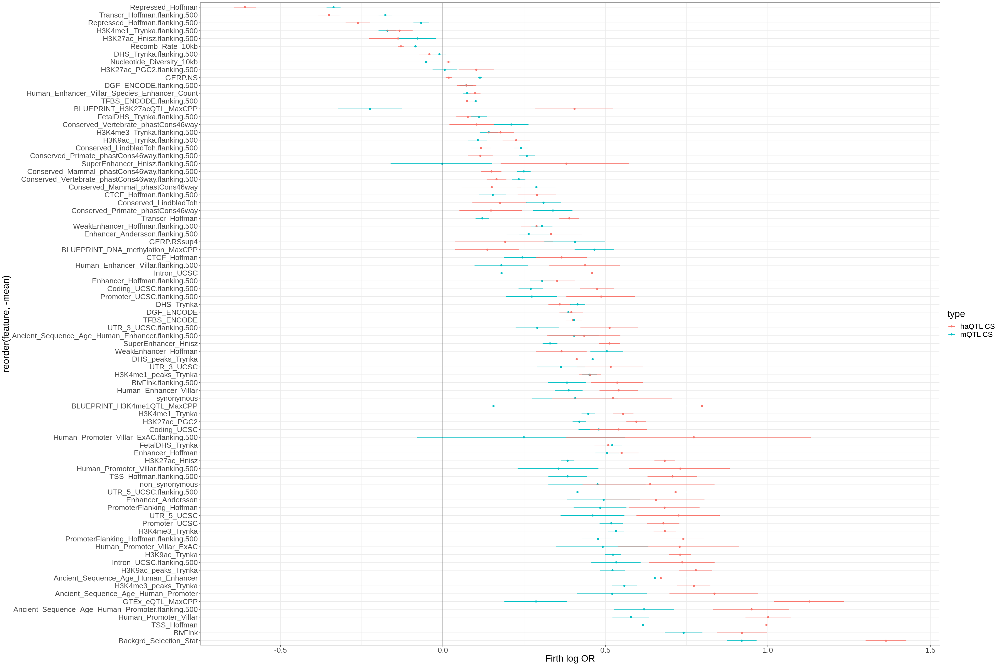

In [293]:
plot_df_flog_m_ha%>%filter(feature!= "CpG_Content_50kb")%>%filter()%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = reorder(feature,-mean), color = type))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Firth log OR")

In [294]:
plot_df_flog_m_ha%>%write_delim("annotation_plot_df_firth_log_ha_m_pval.tsv","\t")

### methylation vs ha

In [140]:
enrichment_feature_m_v_ha =  enrichment_feature%>%filter(signal)%>%mutate(signal = !ID %in% m16$variants)

In [141]:
result_list_flog_m_v_ha = map(colnames(enrichment_feature)[9:ncol(enrichment_feature)],~(logistf( signal ~ enrichment_feature_m_v_ha%>%pull(.x) ,data = enrichment_feature_m_v_ha))  )

In [142]:
plot_df_flog_m_v_ha  = tibble(feature =  colnames(enrichment_feature)[9:ncol(enrichment_feature)] , result = result_list_flog_m_v_ha )%>%mutate(mean = map_dbl(result, ~.x$coefficients[2]) , upper =  map_dbl(result, ~.x$ci.upper[[2]]), lower =  map_dbl(result, ~.x$ci.lower[[2]])  )%>%select(-result)

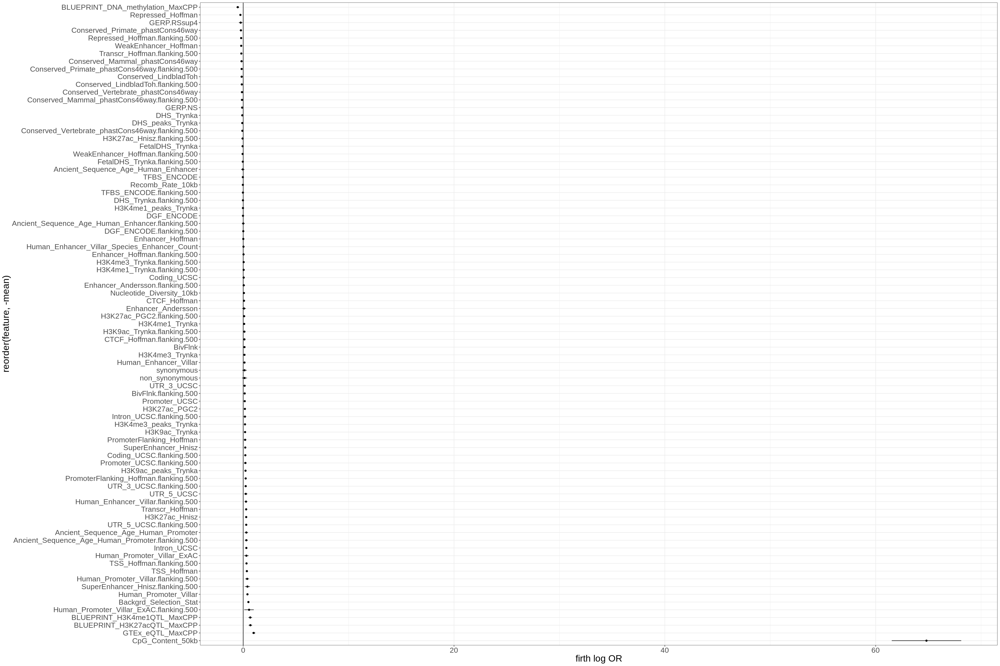

In [143]:
plot_df_flog_m_v_ha%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = reorder(feature,-mean)))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("firth log OR")

In [ ]:
P( ha CS | in a CS  )  

## Detail analysis on the annotation

In [176]:
detail_analysis = inner_join( plot_df_flog_m , plot_df_flog_ha, by = "feature")

In [177]:
detail_analysis = detail_analysis%>%mutate( non_overlap =  lower.x > upper.y |  lower.y > upper.x)

In [178]:
detail_analysis%>%filter(non_overlap)

feature,mean.x,upper.x,lower.x,mean.y,upper.y,lower.y,non_overlap
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
Coding_UCSC.flanking.500,0.270609042,0.30826678,0.23272910,0.47444739,0.52597335,0.422372011,TRUE
Conserved_LindbladToh.flanking.500,0.240155917,0.26095242,0.21934201,0.11756471,0.14896835,0.086089792,TRUE
CTCF_Hoffman.flanking.500,0.153276338,0.19513434,0.11111423,0.28973756,0.34852373,0.230157977,TRUE
H3K27ac_Hnisz,0.383728810,0.40422652,0.36324687,0.68271691,0.71448501,0.651036965,TRUE
H3K27ac_PGC2,0.419798453,0.44040045,0.39918667,0.59525703,0.62573163,0.564773057,TRUE
H3K27ac_PGC2.flanking.500,0.005737904,0.04287511,-0.03164543,0.10288349,0.15627865,0.048835274,TRUE
H3K4me1_Trynka,0.447477048,0.46826386,0.42671410,0.55475725,0.58639889,0.523199219,TRUE
H3K4me3_peaks_Trynka,0.558554942,0.59634056,0.52058648,0.77214275,0.82300876,0.720792415,TRUE
H3K4me3_Trynka,0.533074967,0.55724779,0.50885193,0.68287131,0.71727163,0.648337071,TRUE


In [ ]:
detail_analysis%>%filter(!non_overlap)%>%count(feature)

feature,n
<chr>,<int>
Ancient_Sequence_Age_Human_Promoter,1
Ancient_Sequence_Age_Human_Promoter.flanking.500,1
Backgrd_Selection_Stat,1
BivFlnk,1
BivFlnk.flanking.500,1
BLUEPRINT_H3K27acQTL_MaxCPP,1
BLUEPRINT_H3K4me1QTL_MaxCPP,1
Coding_UCSC.flanking.500,1
CpG_Content_50kb,1


### Cluster the annotation based on cor

In [122]:
reorder_cormat <- function(cormat){
# Use correlation between variables as distance
dd <- as.dist((1-cormat)/2)
hc <- hclust(dd)
cormat <-cormat[hc$order, hc$order]
}
cormat <- reorder_cormat(cor(enrichment_feature[9:ncol(enrichment_feature)]))


In [126]:
feature_cor = reshape2::melt(cormat)

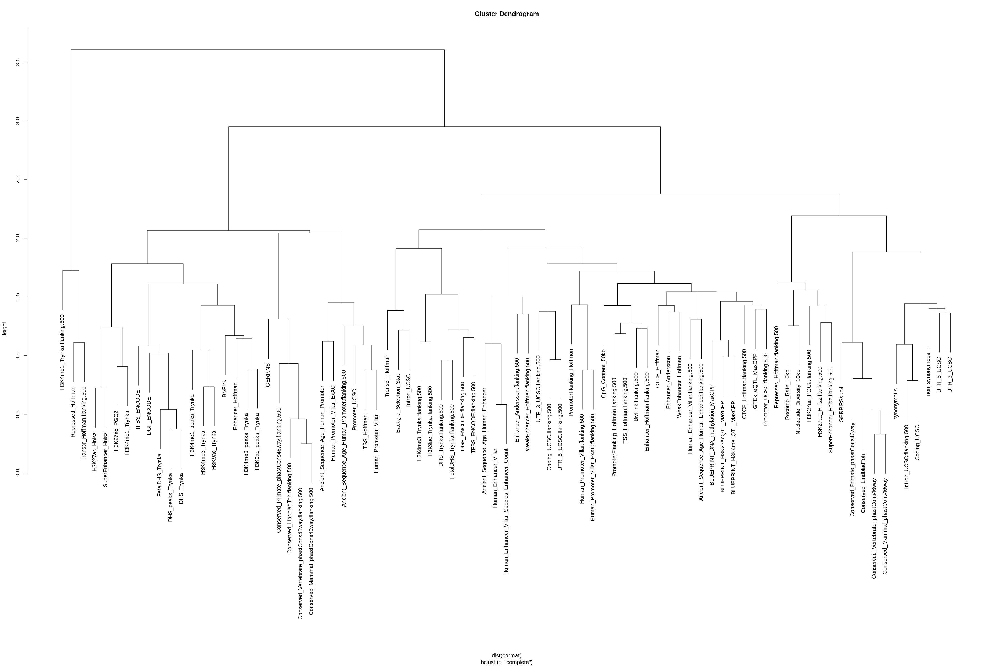

In [145]:
hc <- hclust(dist(cormat))

# Plot the dendrogram
plot(hc)

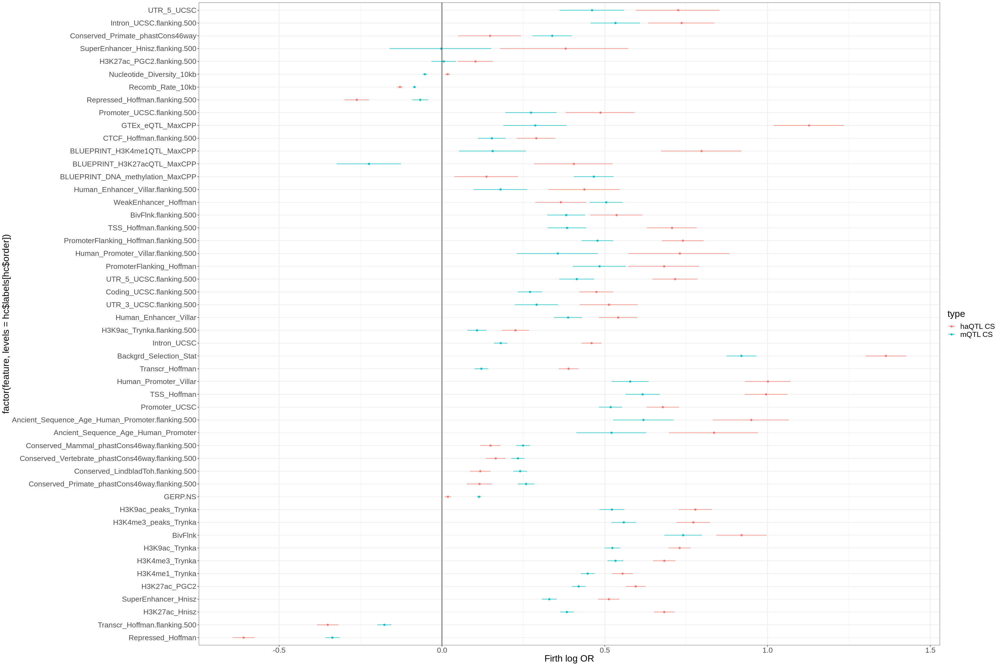

In [266]:
plot_df_flog_m_ha%>%mutate()%>%filter(feature != "CpG_Content_50kb")%>%filter(feature %in% (detail_analysis%>%filter(non_overlap)%>%pull(feature)))%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = factor(feature,levels = hc$labels[hc$order]), color = type))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Firth log OR")

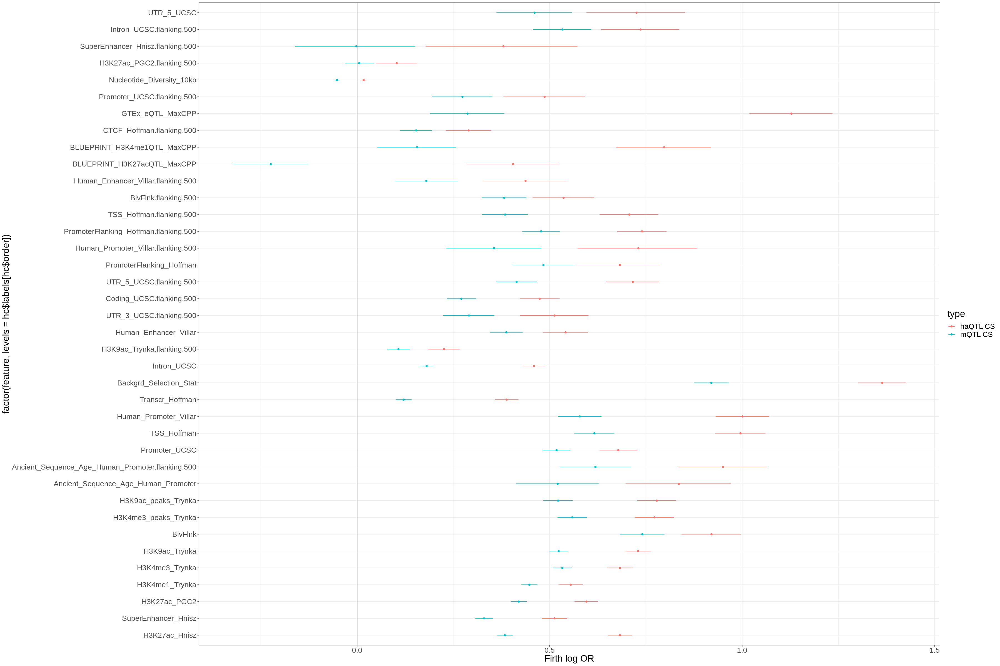

In [184]:
plot_df_flog_m_ha%>%mutate()%>%filter(feature != "CpG_Content_50kb")%>%filter(feature %in% (detail_analysis%>%filter(non_overlap, mean.y > mean.x)%>%pull(feature)))%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = factor(feature,levels = hc$labels[hc$order]), color = type))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Firth log OR")

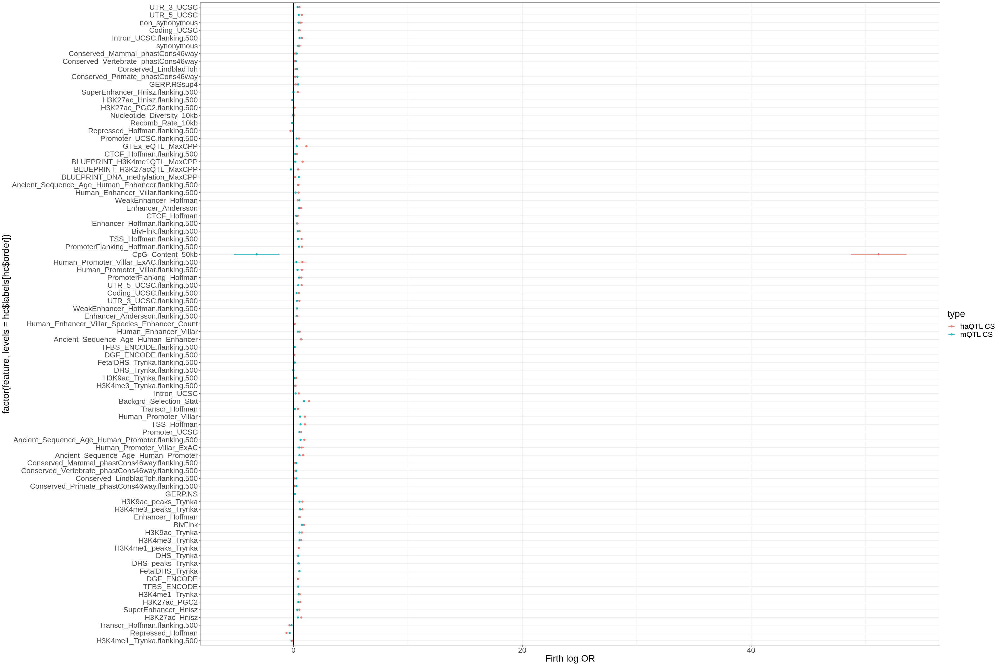

In [ ]:
plot_df_flog_m_ha%>%filter()%>%filter()%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = factor(feature,levels = hc$labels[hc$order]), color = type))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Firth log OR")

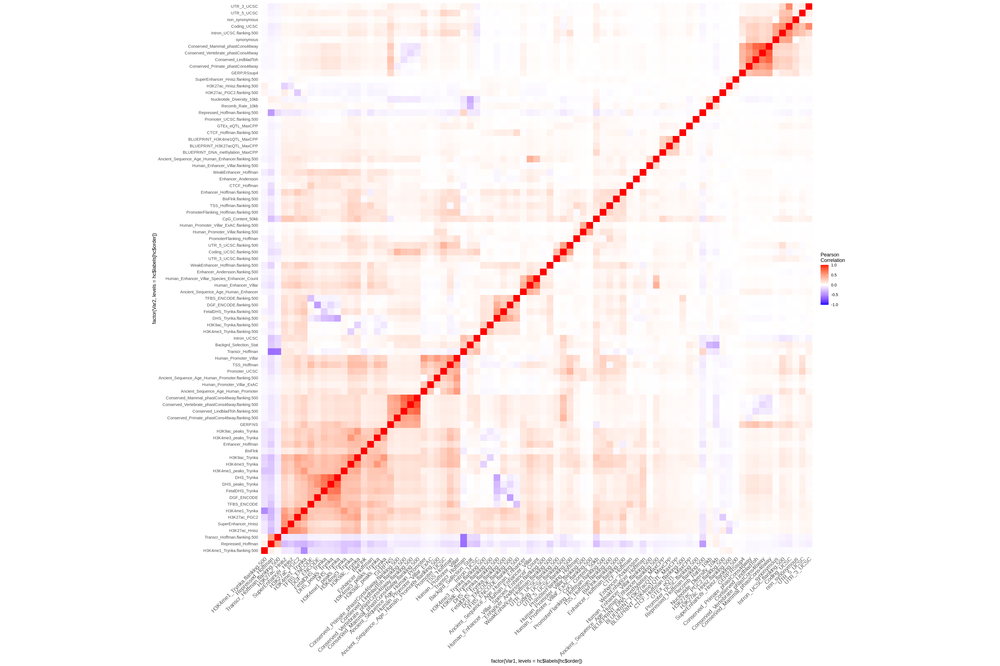

In [256]:
ggplot(data = feature_cor, aes(x=factor(Var1,levels = hc$labels[hc$order]), y=factor(Var2,levels = hc$labels[hc$order]), fill=value)) + 
  geom_tile()+scale_fill_gradient2(low = "blue", high = "red", mid = "white", 
   midpoint = 0, limit = c(-1,1), space = "Lab", 
    name="Pearson\nCorrelation") +
  theme_minimal()+ # minimal theme
 theme(axis.text.x = element_text(angle = 45, vjust = 1, 
    size = 12, hjust = 1))+coord_fixed()



In [ ]:
### Group annotation based on context

In [226]:
a = list(

"genomic_features"= c("CTCF_Hoffman","CTCF_Hoffman.flanking.500","BivFlnk.flanking.500","BivFlnk","Coding_UCSC", "Coding_UCSC.flanking.500", "Intron_UCSC", "Intron_UCSC.flanking.500", "UTR_3_UCSC", "UTR_3_UCSC.flanking.500", "UTR_5_UCSC", "UTR_5_UCSC.flanking.500","DGF_ENCODE","DGF_ENCODE.flanking.500","DHS_peaks_Trynka","DHS_Trynka","DHS_Trynka.flanking.500","FetalDHS_Trynka","FetalDHS_Trynka.flanking.500","Repressed_Hoffman","Repressed_Hoffman.flanking.500","TFBS_ENCODE","TFBS_ENCODE.flanking.500","Transcr_Hoffman","Transcr_Hoffman.flanking.500","TSS_Hoffman","TSS_Hoffman.flanking.500")
,
"promoter" = c("PromoterFlanking_Hoffman", "PromoterFlanking_Hoffman.flanking.500", "Promoter_UCSC", "Promoter_UCSC.flanking.500","Human_Promoter_Villar","Human_Promoter_Villar.flanking.500","Ancient_Sequence_Age_Human_Promoter","Ancient_Sequence_Age_Human_Promoter.flanking.500","Human_Promoter_Villar_ExAC","Human_Promoter_Villar_ExAC.flanking.500")
,
"enhancer" = c("WeakEnhancer_Hoffman.flanking.500","WeakEnhancer_Hoffman","WeakEnhancer_Hoffman","Enhancer_Andersson", "Enhancer_Andersson.flanking.500", "Enhancer_Hoffman", "Enhancer_Hoffman.flanking.500", "SuperEnhancer_Hnisz", "SuperEnhancer_Hnisz.flanking.500","Human_Enhancer_Villar","Human_Enhancer_Villar.flanking.500","Ancient_Sequence_Age_Human_Enhancer","Ancient_Sequence_Age_Human_Enhancer.flanking.500","Human_Enhancer_Villar_Species_Enhancer_Count")
,
"histone_modifications" = c("H3K27ac_PGC2.flanking.500","H3K27ac_PGC2","BLUEPRINT_H3K27acQTL_MaxCPP","H3K27ac_Hnisz", "H3K27ac_Hnisz.flanking.500", "H3K4me1_peaks_Trynka", "H3K4me1_Trynka", "H3K4me1_Trynka.flanking.500", "H3K4me3_peaks_Trynka", "H3K4me3_Trynka", "H3K4me3_Trynka.flanking.500", "H3K9ac_peaks_Trynka", "H3K9ac_Trynka", "H3K9ac_Trynka.flanking.500",'BLUEPRINT_H3K4me1QTL_MaxCPP')
,
"conservation" = c("Conserved_LindbladToh","Conserved_LindbladToh.flanking.500","Conserved_Vertebrate_phastCons46way","Conserved_Vertebrate_phastCons46way.flanking.500","Conserved_Mammal_phastCons46way","Conserved_Mammal_phastCons46way.flanking.500","Conserved_Primate_phastCons46way","Conserved_Primate_phastCons46way.flanking.500")
,
"dna_methylation" = c("BLUEPRINT_DNA_methylation_MaxCPP", "CpG_Content_50kb")
,
"others" = c('GERP.NS','GERP.RSsup4','Recomb_Rate_10kb','Nucleotide_Diversity_10kb','Backgrd_Selection_Stat','GTEx_eQTL_MaxCPP','synonymous','non_synonymous')

)


In [237]:
stack(a)

values,ind
<chr>,<fct>
CTCF_Hoffman,genomic_features
CTCF_Hoffman.flanking.500,genomic_features
BivFlnk.flanking.500,genomic_features
BivFlnk,genomic_features
Coding_UCSC,genomic_features
Coding_UCSC.flanking.500,genomic_features
Intron_UCSC,genomic_features
Intron_UCSC.flanking.500,genomic_features
UTR_3_UCSC,genomic_features


In [232]:
plot_df_flog_m_ha_grouped = left_join(plot_df_flog_m_ha, stack(a), by = c("feature" = "values"))

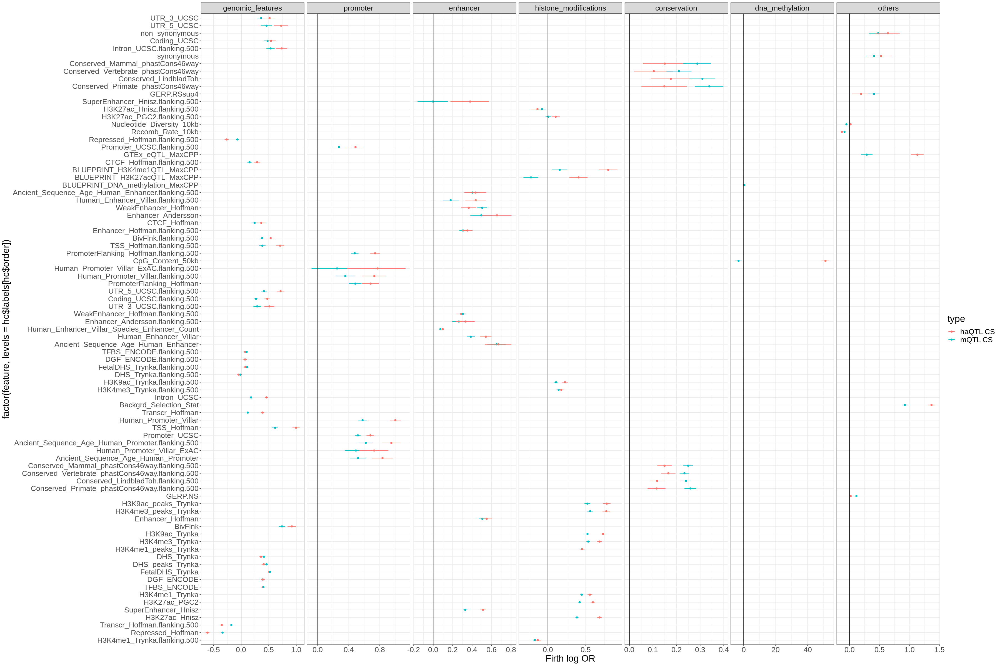

In [268]:
plot_df_flog_m_ha_grouped%>%filter()%>%filter()%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = factor(feature,levels = hc$labels[hc$order]), color = type))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Firth log OR")+facet_grid(.~ind,scales = "free")

In [272]:
plot_df_flog_m_ha_grouped

feature,mean,upper,lower,type,ind
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
Coding_UCSC,0.479807454,0.54169911,0.41733762,mQTL CS,genomic_features
Coding_UCSC.flanking.500,0.270609042,0.30826678,0.23272910,mQTL CS,genomic_features
Conserved_LindbladToh,0.309695261,0.36366342,0.25523892,mQTL CS,conservation
Conserved_LindbladToh.flanking.500,0.240155917,0.26095242,0.21934201,mQTL CS,conservation
CTCF_Hoffman,0.244224749,0.29916081,0.18876020,mQTL CS,genomic_features
CTCF_Hoffman.flanking.500,0.153276338,0.19513434,0.11111423,mQTL CS,genomic_features
DGF_ENCODE,0.386268070,0.41112837,0.36134517,mQTL CS,genomic_features
DGF_ENCODE.flanking.500,0.071521709,0.09183673,0.05120073,mQTL CS,genomic_features
DHS_peaks_Trynka,0.460701252,0.48717553,0.43415193,mQTL CS,genomic_features


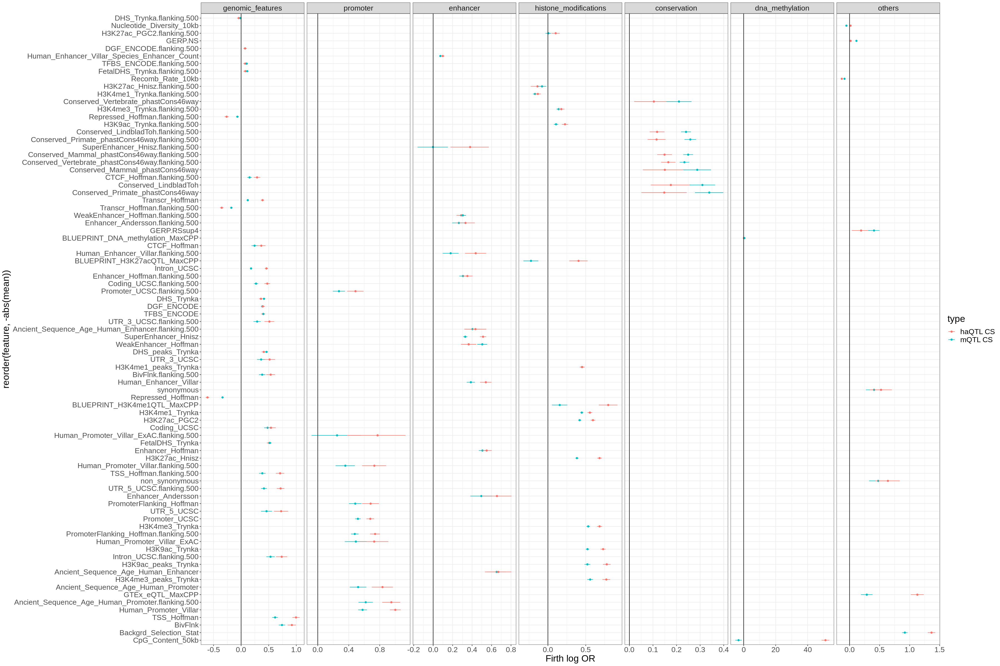

In [271]:
plot_df_flog_m_ha_grouped%>%filter()%>%filter(non)%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y =  reorder(feature,-abs(mean)), color = type))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Firth log OR")+facet_grid(.~ind,scales = "free")

Warning message:
“The shape palette can deal with a maximum of 6 discrete values because
more than 6 becomes difficult to discriminate; you have 7. Consider
specifying shapes manually if you must have them.”
Warning message:
“Removed 16 rows containing missing values (`geom_point()`).”


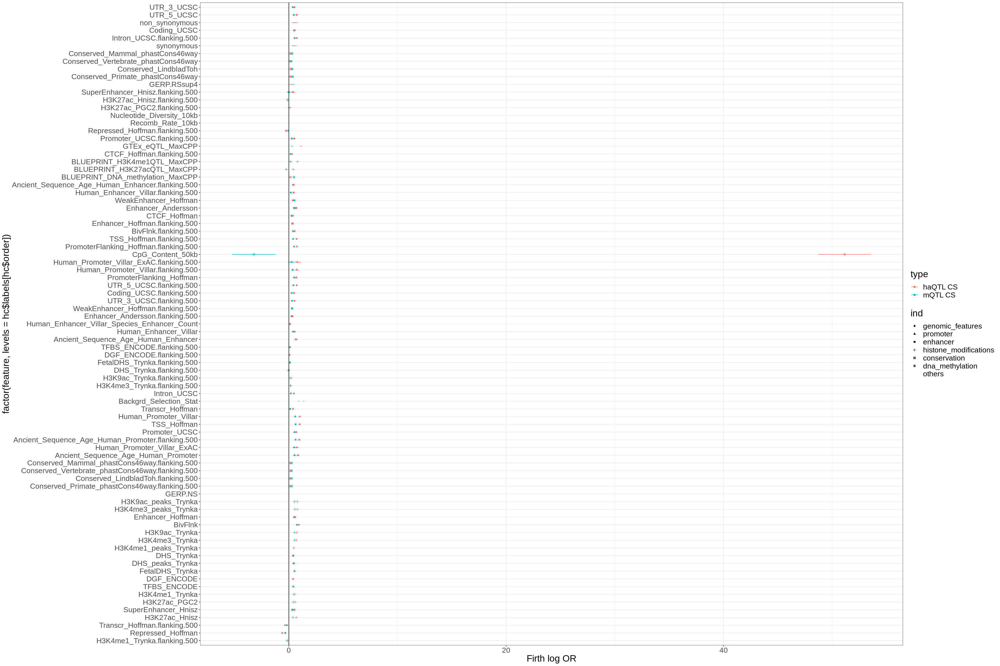

In [244]:
plot_df_flog_m_ha_grouped%>%filter()%>%filter()%>%arrange(mean)%>%ggplot()+geom_point(aes(x = mean, y = factor(feature,levels = hc$labels[hc$order]),shape = ind, color = type))+geom_linerange(aes(xmin = lower, xmax= upper , y = feature ,  color = type))+geom_vline(aes( xintercept = 0 ))+theme_bw()+theme(text = element_text(size = 20))+xlab("Firth log OR")

In [273]:
plot_df_flog_m_ha_grouped%>%write_delim("annotation_plot_df_firth_log_ha_m_")

feature,mean,upper,lower,type,ind
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
Coding_UCSC,0.479807454,0.54169911,0.41733762,mQTL CS,genomic_features
Coding_UCSC.flanking.500,0.270609042,0.30826678,0.23272910,mQTL CS,genomic_features
Conserved_LindbladToh,0.309695261,0.36366342,0.25523892,mQTL CS,conservation
Conserved_LindbladToh.flanking.500,0.240155917,0.26095242,0.21934201,mQTL CS,conservation
CTCF_Hoffman,0.244224749,0.29916081,0.18876020,mQTL CS,genomic_features
CTCF_Hoffman.flanking.500,0.153276338,0.19513434,0.11111423,mQTL CS,genomic_features
DGF_ENCODE,0.386268070,0.41112837,0.36134517,mQTL CS,genomic_features
DGF_ENCODE.flanking.500,0.071521709,0.09183673,0.05120073,mQTL CS,genomic_features
DHS_peaks_Trynka,0.460701252,0.48717553,0.43415193,mQTL CS,genomic_features


In [275]:
plot_df_flog_m_ha_grouped

feature,mean,upper,lower,type,ind
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
Coding_UCSC,0.479807454,0.54169911,0.41733762,mQTL CS,genomic_features
Coding_UCSC.flanking.500,0.270609042,0.30826678,0.23272910,mQTL CS,genomic_features
Conserved_LindbladToh,0.309695261,0.36366342,0.25523892,mQTL CS,conservation
Conserved_LindbladToh.flanking.500,0.240155917,0.26095242,0.21934201,mQTL CS,conservation
CTCF_Hoffman,0.244224749,0.29916081,0.18876020,mQTL CS,genomic_features
CTCF_Hoffman.flanking.500,0.153276338,0.19513434,0.11111423,mQTL CS,genomic_features
DGF_ENCODE,0.386268070,0.41112837,0.36134517,mQTL CS,genomic_features
DGF_ENCODE.flanking.500,0.071521709,0.09183673,0.05120073,mQTL CS,genomic_features
DHS_peaks_Trynka,0.460701252,0.48717553,0.43415193,mQTL CS,genomic_features
